In [1]:
# Import necessary functions

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import cv2
from PIL import Image

In [2]:
resnet18 = models.resnet18()
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [3]:
# making changes to resent as required by our problem
resnet18 = models.resnet18()
numFeatures = resnet18.fc.in_features

# Modifying the fully connected layer
resnet18.fc = nn.Sequential(
    nn.Linear(numFeatures, 256),
    nn.ReLU(),
    nn.Dropout(0.8),
    nn.Linear(256,2),
)



In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [6]:
# Print the model architecture
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [7]:
# Loading the trained weights from problem 1
resnet18.load_state_dict(torch.load("model_crop.pth"))

<All keys matched successfully>

In [8]:
# Accessing layers in resnet 18
print(resnet18.conv1)

# Accessing 
print(resnet18.layer1[0].conv1)

Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)


In [9]:
# Function to plot the filters 
def plotFiltersInRGB(filterWeights,numFilters=64) -> None:
    
    # Normalize the filter weights
    wmin = filterWeights.min()
    wmax = filterWeights.max()
    filterWeights = (filterWeights - wmin) / (wmax - wmin)
    
    # Filter weights are of the form (numFilters,numChannels,filterHeight,filterWidth)
    numChannels = filterWeights.shape[1]
    
    # Create a figure to plot the filters in a grid
    fig,axes = plt.subplots(8,8,figsize=(12,12))
    
    # Looping and plotting filters in 8x8 grid  
    for index in range(numFilters):
        ax = axes[index//8,index%8] # index // 8 denotes \floor(index/8) and index % 8 denotes index mod 8
        
        if(numChannels == 3):
            # 1. Convert from (C,H,W) --> (H,W,C)
            image = filterWeights[index].permute(1,2,0).numpy()
            
            # 2. Display RGB Image
            ax.imshow(image)
        else:
            # For Grayscale filters
            image = filterWeights[index,0].numpy()
            ax.imshow(image,cmap='gray')
            
        ax.axis('off')
        
    plt.show()
        
        

In [10]:
# Function to visualize filters of layer 1
def visualizeFirstLayer(model, modelname: str) -> None:
    filters = None
    
    if isinstance(model, models.ResNet):
        filters = model.conv1.weight.data
    else:
        raise ValueError("Unsupported model type received")
    
    print(f"Visualizing first 64 Filters of {modelname} -> ")
    plotFiltersInRGB(filters,numFilters=64)

Visualizing first 64 Filters of ResNet 18 Model -> 


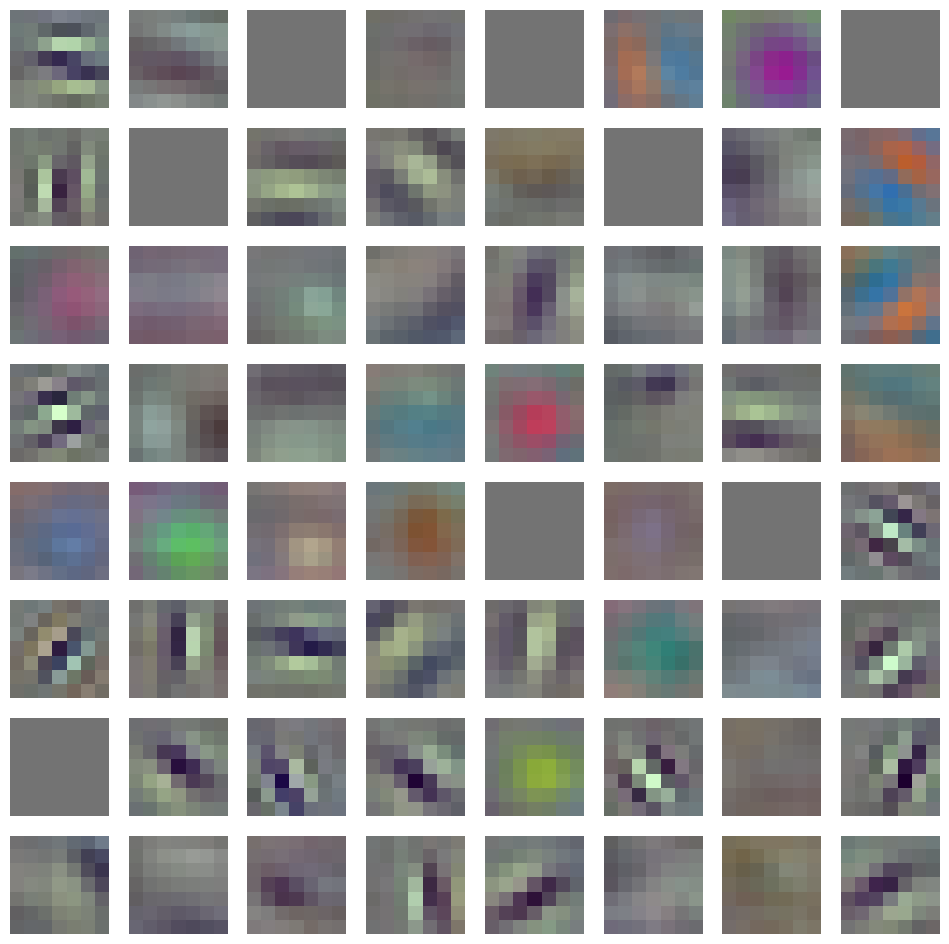

In [26]:
visualizeFirstLayer(resnet18,"ResNet 18 Model")

In [11]:
# Visualizing# Defining a function to pre process the image
def preprocessImage(imagePath):
    
    # Define transform
    preprocess = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
    ])
    
    image = Image.open(image_path).convert('RGB')
    image = preprocess(image)   # Data preprocessing
    image = image.unsqueeze(0)  # Add batch dimension to make it of the form (1,channels,height,width)
    return image

image_path = "../TestImages/test6.png"
inputImage = preprocessImage(image_path) #activation maps after this layer


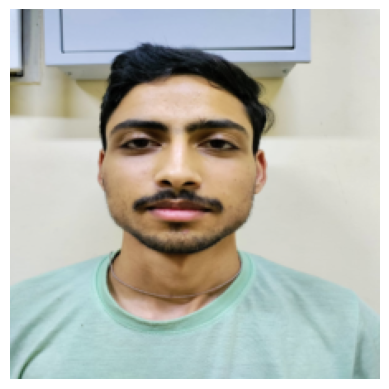

In [12]:
# plot the image
def plotImage(image):
    image = image.squeeze(0)     # Remove batch dimension
    image = image.permute(1,2,0) # (C,H,W) --> (H,W,C)
    image = image.numpy()
    image = (image - np.min(image)) / (np.max(image) - np.min(image)) # Normalize the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
plotImage(inputImage)

Layer 1: Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
activation shape: torch.Size([1, 64, 112, 112])
Visualizing activation maps for layer 1
Number of filters: 64


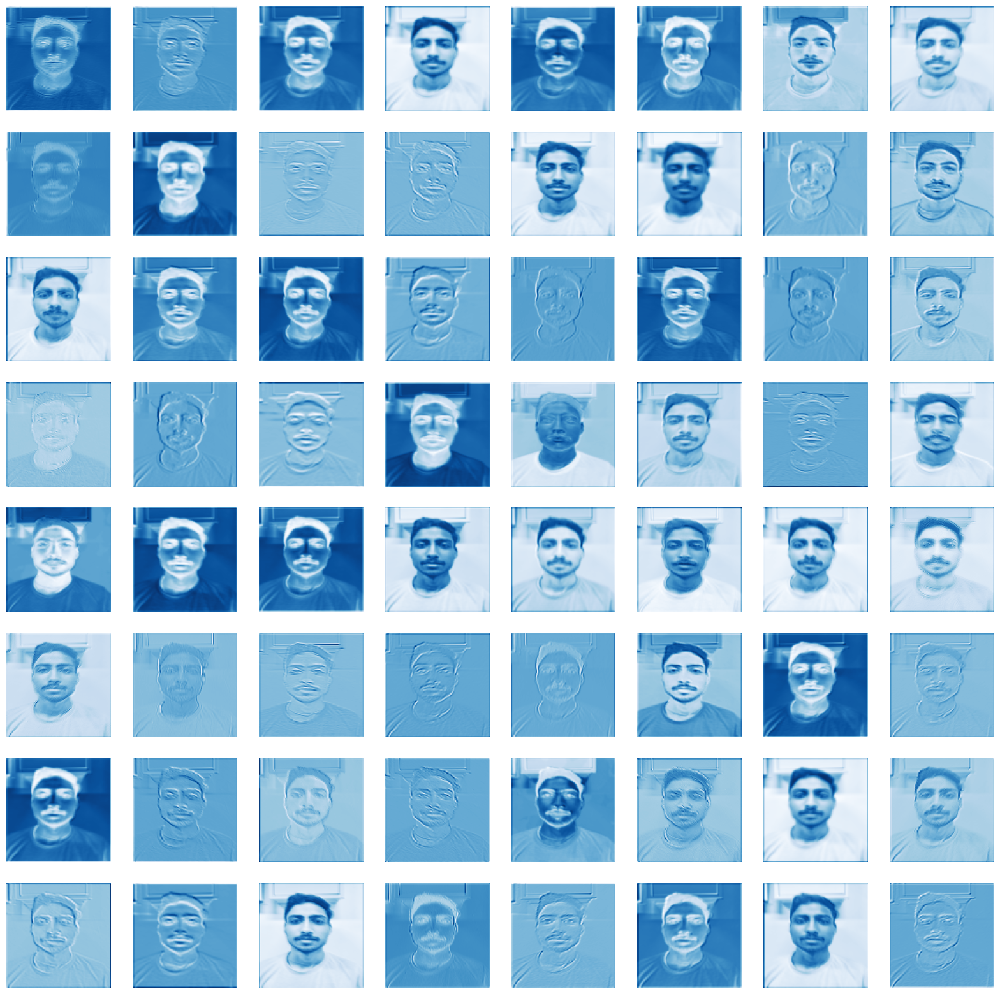

In [70]:
# Define a hook function to capture the activations

def hookFunction(module, input, output):
    activations.append(output)
    
# List to store activation maps
activations = []

# Register hooks to capture activations from all convolutional layers
hooks = []
for name, module in resnet18.named_modules():
    
    hook = module.register_forward_hook(hookFunction)
    hooks.append(hook)

# Forward pass through the network
with torch.no_grad():
    output = resnet18(inputImage)
    
# Remove hooks
for hook in hooks:
    hook.remove()
    
# Define a function to visualize the activation maps
def visualize_activation(activationMaps, numColumns=8):
    
    numLayers = len(activationMaps)
    for i in range(numLayers):
        activation = activationMaps[i]
        numFilters = activation.size(1)
        
        # print which layer module is being visualized
        
        print(f"Layer {i+1}: {list(resnet18.children())[i]}")
        print(f"activation shape: {activation.shape}")
        print(f"Visualizing activation maps for layer {i+1}")
        print(f"Number of filters: {numFilters}")
        # calculate the number of rows required
        numRows = (numFilters + numColumns - 1) // numColumns
        
        fig, axes = plt.subplots(numRows, numColumns, figsize=(20, 20))
        axes = axes.flatten()
        
        for j in range(numFilters):
            image = activation[0, j].cpu().numpy() # Extract jth filter from the activation map
            axes[j].imshow(image, cmap='Blues')
            axes[j].axis('off')
            
        # Turn off any remaining axes
        for k in range(numFilters, len(axes)):
            axes[k].axis('off')
            
        plt.show()
        
# Visualize the activation maps from the first convolutional layer
visualize_activation(activations[:1])

Layer 1: Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
activation shape: torch.Size([1, 64, 112, 112])
Visualizing activation maps for layer 1
Number of filters: 64


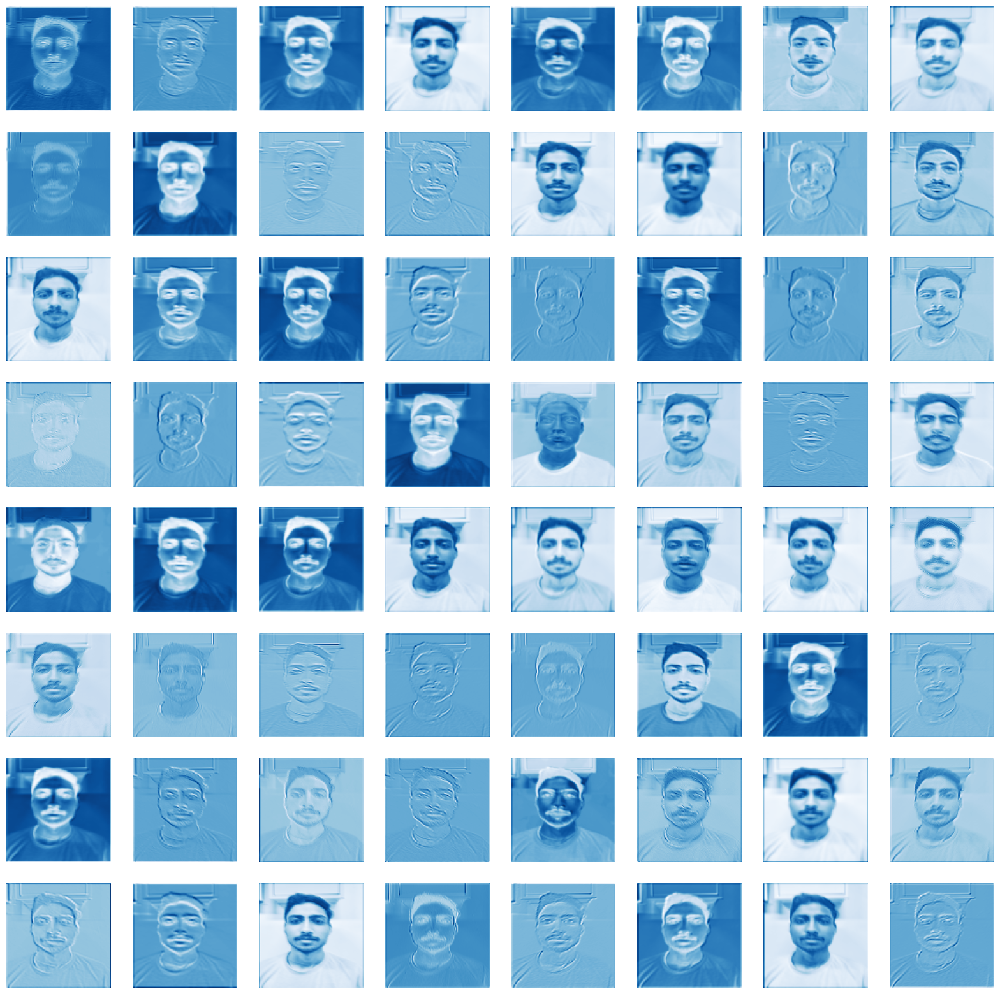

Layer 2: BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
activation shape: torch.Size([1, 64, 112, 112])
Visualizing activation maps for layer 2
Number of filters: 64


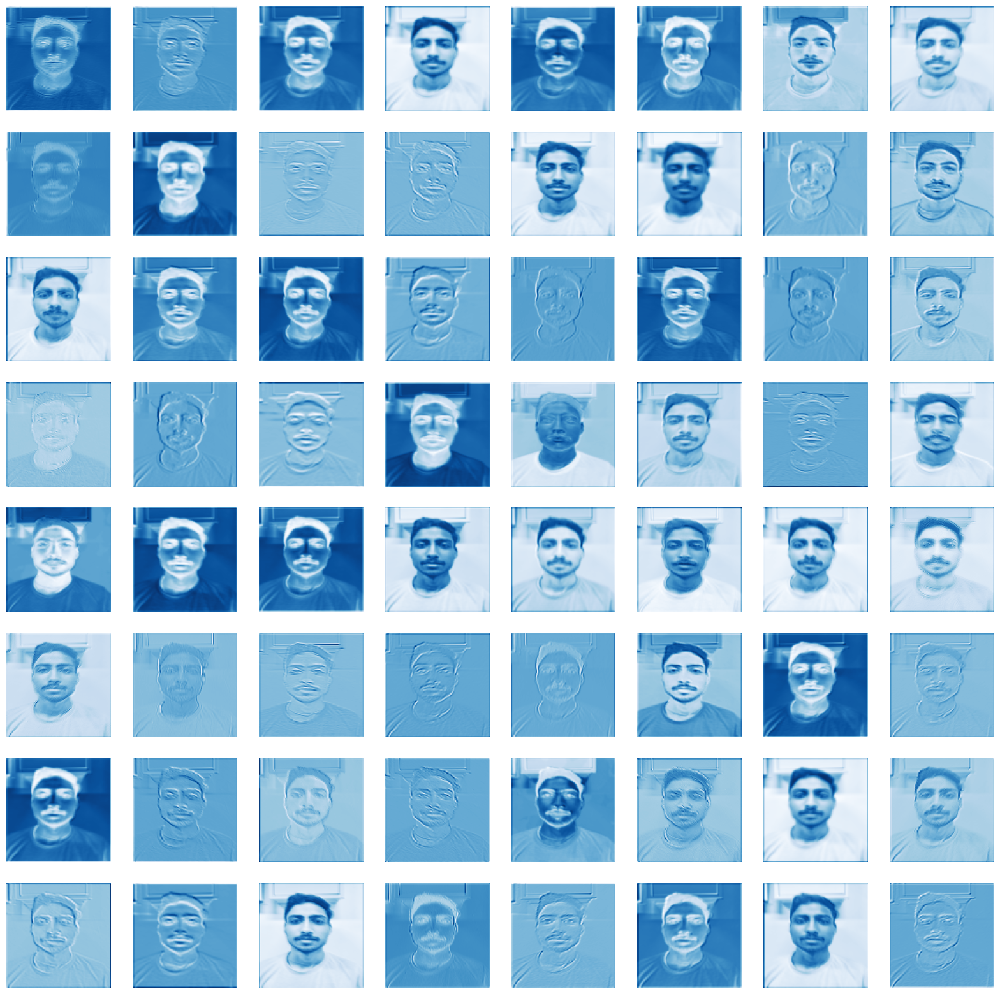

Layer 3: ReLU(inplace=True)
activation shape: torch.Size([1, 64, 112, 112])
Visualizing activation maps for layer 3
Number of filters: 64


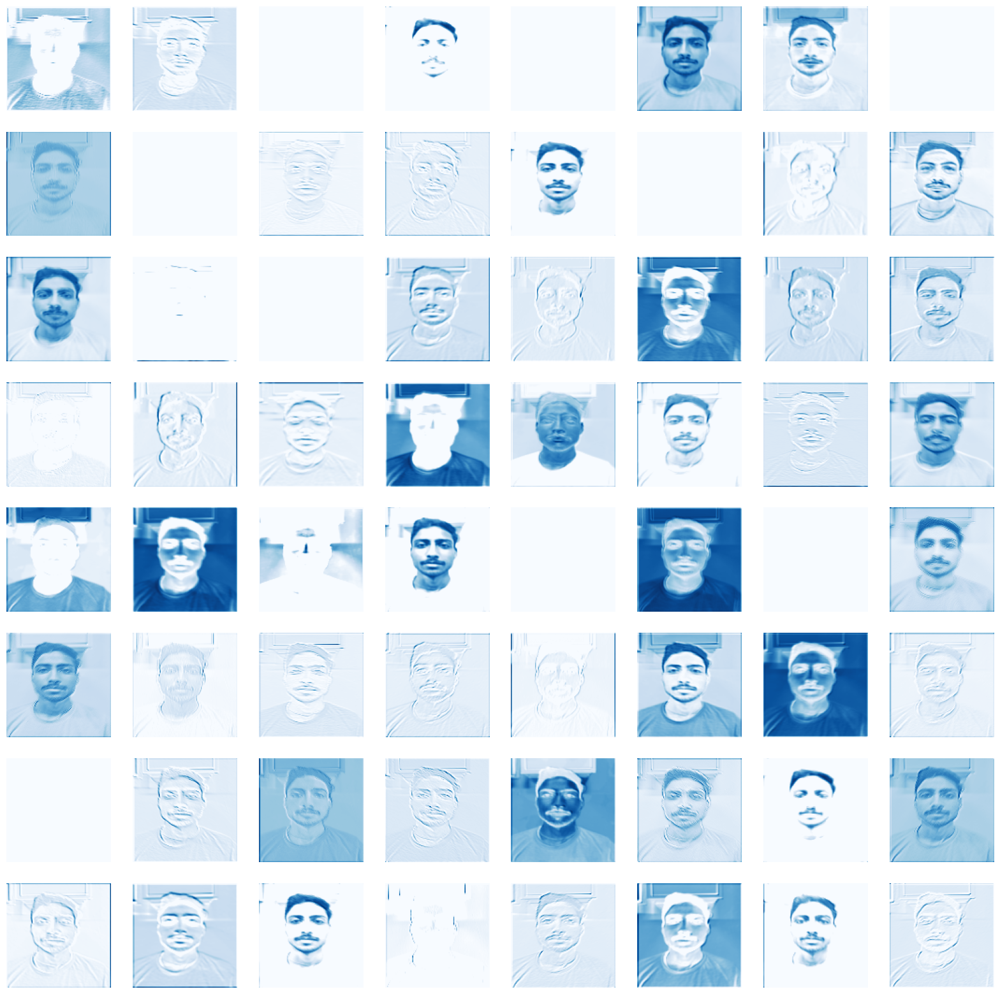

Layer 4: MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
activation shape: torch.Size([1, 64, 112, 112])
Visualizing activation maps for layer 4
Number of filters: 64


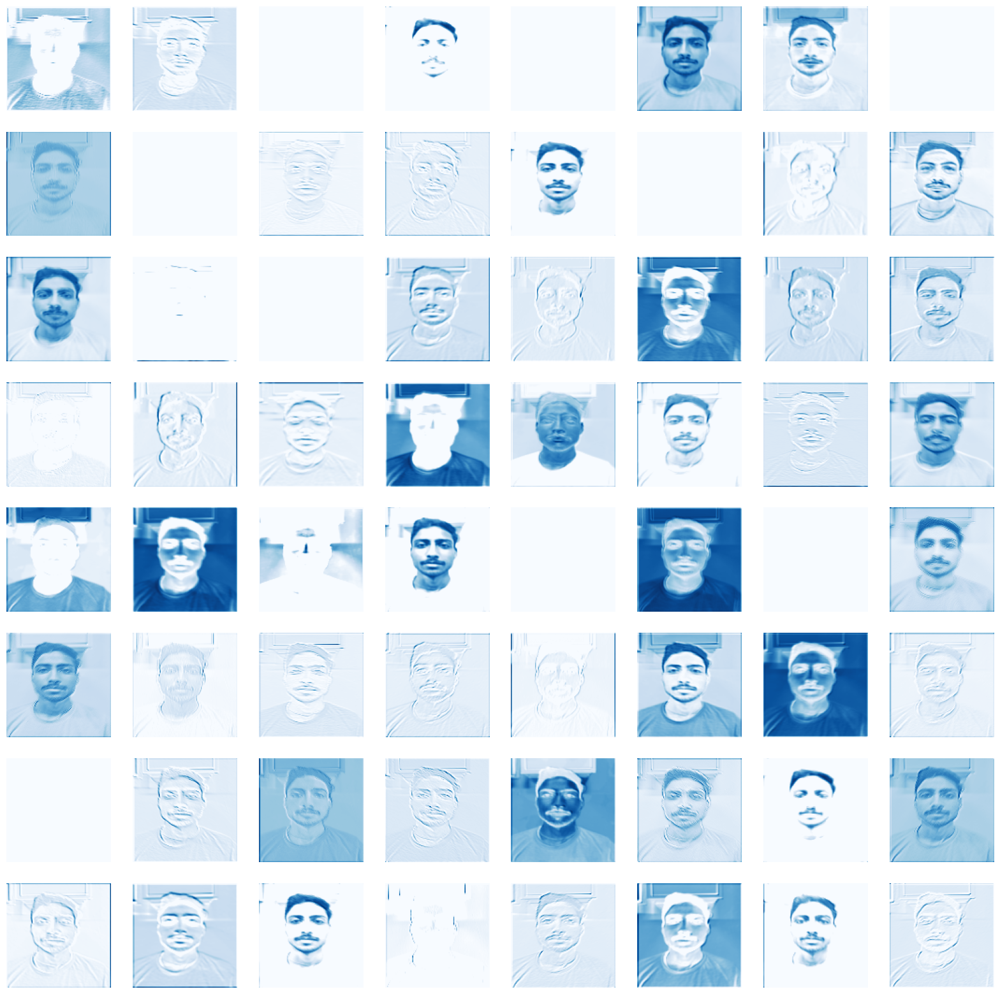

Layer 5: Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
)
activation shape: torch.Size([1, 64, 56, 56])
Visualizing activation maps for layer 5
Number of filters: 64


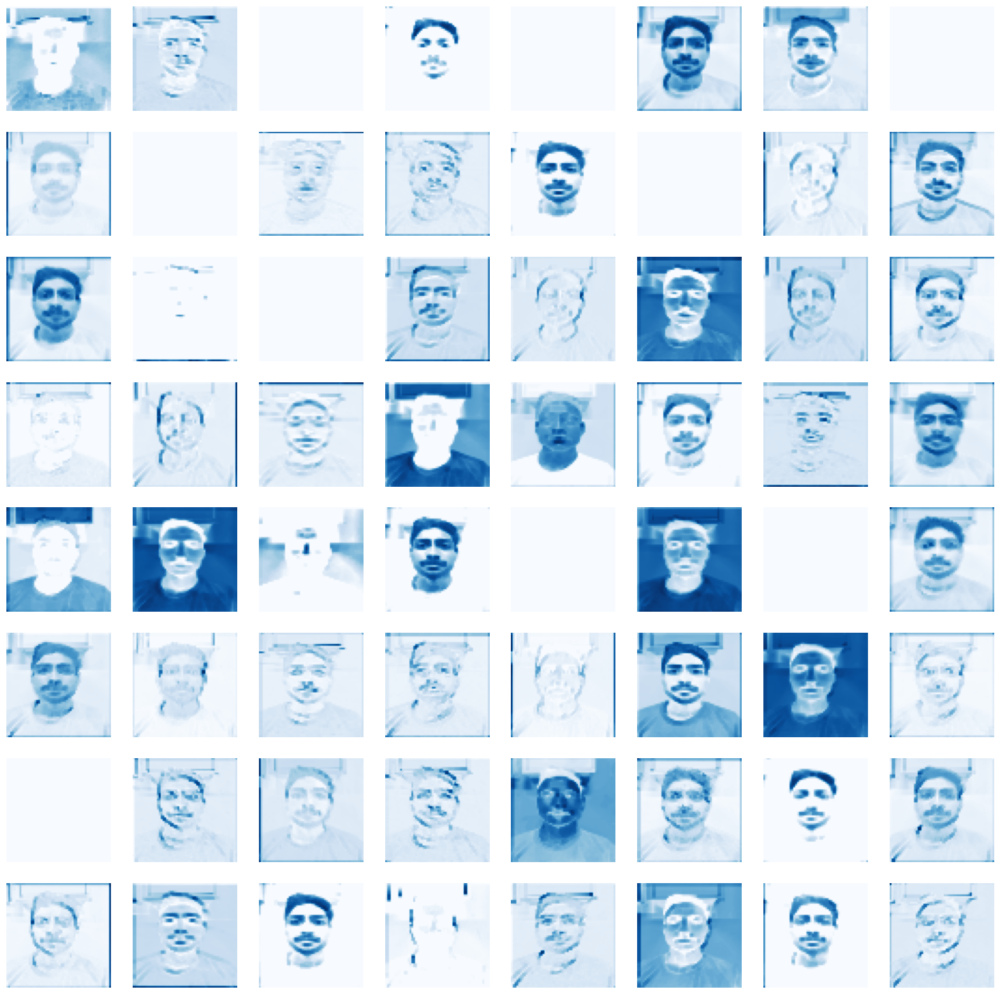

In [72]:
# Visualize the more activation maps 
visualize_activation(activations[:5]) # Change this value to go deeper into the network

# Occlusion Experiments

In [2]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision import models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Load a pre-trained model, e.g., ResNet18
model = models.resnet18()
numFeatures = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(numFeatures, 256),  # First hidden layer
    nn.ReLU(),                    # Activation function
    nn.Dropout(0.8),              # Dropout for regularization (optional)
    nn.Linear(256, 2),            # Output layer for binary classification
)

model.load_state_dict(torch.load("model_crop2.pth"))
model.eval()

# Define a transformation to preprocess the input image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load and preprocess the image
image_path = "../TestImages/occu.jpeg"  # Replace with your image path
image = Image.open(image_path).convert("RGB")
input_image = transform(image).unsqueeze(0)  # Add batch dimension

# Define the occlusion experiment parameters
occlusion_size = 20  # Size of the square patch to occlude
stride = 10  # Stride for the occlusion
_, _, height, width = input_image.shape
heatmap = np.zeros((height, width))

# Perform the occlusion experiment
for y in range(0, height, stride):
    for x in range(0, width, stride):
        # Create a copy of the input image to occlude
        occluded_image = input_image.clone()
        occluded_image[:, :, y:y + occlusion_size, x:x + occlusion_size] = 0  # Set patch to zero
        
        # Make predictions with the occluded image
        with torch.no_grad():
            output = model(occluded_image)
            prob = nn.Softmax(dim=1)(output)
        
        # Store the class probability for the target class (e.g., top predicted class)
        target_class = prob[0].argmax().item()  # Use the class of the original image
        heatmap[y:y + stride, x:x + stride] = prob[0, target_class].item()

# Normalize heatmap to [0, 1]
heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap))

# Resize the heatmap to match the image size
heatmap_resized = np.array(Image.fromarray((heatmap * 255).astype(np.uint8)).resize(image.size))

# Visualize the heatmap
fig, ax = plt.subplots()
ax.imshow(image)
ax.imshow(heatmap_resized, cmap='jet', alpha=0.5)  # Adjust alpha for transparency
plt.colorbar(cm.ScalarMappable(cmap='jet'), ax=ax, fraction=0.046, pad=0.04)
ax.set_title('Occlusion Sensitivity Heatmap')
plt.axis('off')
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '../TestImages/ayush2.jpeg'